In [1]:
import cv2
import matplotlib.pyplot as plt
import glob
import numpy as np
%matplotlib inline

In [25]:
def camera_calibration():
    objpoints = []
    imgpoints = []
    objp = np.zeros((6*9,3),np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    url = '../CarND-Advanced-Lane-Lines/camera_cal/'
    name = 'calibration*.jpg'

    images = glob.glob(url+name)

    if len(images)>0:
        for image in images:
            img = cv2.imread(image)
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            ret, corners = cv2.findChessboardCorners(gray, (9, 6), None)
            if ret == True:
                imgpoints.append(corners)
                objpoints.append(objp)

        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)
        return mtx, dist
    else:
        return None, None
mtx, dist = camera_calibration()

In [431]:
def undist (img):
    return cv2.undistort(img, mtx, dist, None, mtx)
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    """
    Function takes an image, grayscale it, applies Sobel x or y, 
    then takes an absolute value and applies a threshold.
    """
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient!='x':
        sobel_x = 0
        sobel_y = 1
    else:
        sobel_x = 1
        sobel_y = 0
    sobel = cv2.Sobel(gray, cv2.CV_64F, sobel_x, sobel_y)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel>thresh_min)&(scaled_sobel<=thresh_max)]=1
    # 6) Return this mask as your binary_output image
    return binary_output

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    """
    Function applies Sobel x and y, then computes the magnitude of the gradient
    and applies a threshold
    """    
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    abs_sobelxy = (sobelx**2+sobely**2)**0.5
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobelxy = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(scaled_sobelxy)
    binary_output[(scaled_sobelxy>mag_thresh[0])&(scaled_sobelxy<mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    """
    Function applies Sobel x and y, then computes the direction of the gradient
    and applies a threshold.
    """ 
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    direction = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(direction)
    binary_output[(direction>thresh[0])&(direction<thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

def binary_and(binary1, binary2):
    """
    Function takes to binary images same shape and return their intersection
    """
    if binary1.shape == binary2.shape:
        binary = np.where(np.logical_and(binary1,binary2)==True, 1., 0.)
        return binary
    else:
        return None

def binary_or(binary1, binary2):
    """
    Function takes to binary images same shape and return their union
    """
    if binary1.shape == binary2.shape:
        binary = np.where(np.logical_or(binary1,binary2)==True, 1., 0.)
        return binary
    else:
        return None

def binary_xor(binary1, binary2):
    """
    Function takes to binary images same shape and return their union
    """
    if binary1.shape == binary2.shape:
        binary = np.where(np.logical_xor(binary1,binary2)==True, 1., 0.)
        return binary
    else:
        return None
    
def ch_threshold(img, ch=0, thresh=(0,180)):
    """
    Function takes an image (RGB, HSV, etc.),
    channel (0,1,2) for 3 channels, threshold
    and returns binary image of the thresholded channel 
    """
    if img.shape[2]>ch:
        CH = img[:,:,ch]
        binary = np.zeros_like(CH)
        binary [(CH>thresh[0])&(CH<=thresh[1])] = 1
        return binary
    else:
        return None
    
def show_2gr(img1,img2):
    """
    Function takes 2 images and plot them next to each other.
    """
    f, (ax1,ax2) = plt.subplots(1,2,figsize=(20,10))
    ax1.imshow(img1, cmap='gray')
    ax2.imshow(img2, cmap='gray')

def warp(img):
    """
    Function takes an image and return an image with perspective transformation applied.
    Src points were taken on the images, provided by Udacity. Depends from the camera.
    Proportion is not saved: height ~22.5m, width ~7.4m
    """
    w,h = img.shape[1],img.shape[0] 
    img_size=(w,h)
    y = 0.8*h
    #x = 3.7/18*y
    x=0.5*w
    src = np.float32([[434./1280*w,562./720*h],
                      [589./1280*w,453./720*h],
                      [694./1280*w,453./720*h],
                      [864./1280*w,562./720*h]])
    dst = np.float32([[(w-x)/2.,0.9*h],
                      [(w-x)/2.,0.1*h],
                      [(w+x)/2.,0.1*h],
                      [(w+x)/2.,0.9*h]])
    M = cv2.getPerspectiveTransform(src,dst)
    img_warp = cv2.warpPerspective(img,M,img_size,flags=cv2.INTER_LINEAR)
    return img_warp

def unwarp(img):
    """
    Function takes an image and return an image with perspective transformation applied.
    Src points were taken on the images, provided by Udacity. Depends from the camera.
    Proportion is not saved: height ~22.5m, width ~7.4m
    """
    w,h = img.shape[1],img.shape[0] 
    img_size=(w,h)
    y = 0.8*h
    #x = 3.7/18*y
    x=0.5*w
    dst = np.float32([[434./1280*w,562./720*h],
                      [589./1280*w,453./720*h],
                      [694./1280*w,453./720*h],
                      [864./1280*w,562./720*h]])
    src = np.float32([[(w-x)/2.,0.9*h],
                      [(w-x)/2.,0.1*h],
                      [(w+x)/2.,0.1*h],
                      [(w+x)/2.,0.9*h]])
    M = cv2.getPerspectiveTransform(src,dst)
    img_warp = cv2.warpPerspective(img,M,img_size,flags=cv2.INTER_LINEAR)
    return img_warp

def hist(img):
    """
    Function takes binary image and returns histogram: 
    sum of "1" pixel for each x on the bottom half of the image
    """
    histogram = np.sum(img[img.shape[0]/2:,:], axis=0)
    return histogram

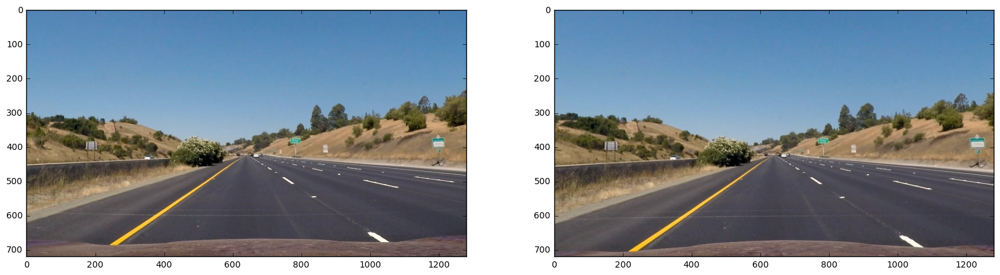

In [28]:
#fname = 'CarND-Advanced-Lane-Lines/camera_cal/calibration5.jpg'
fname = '/Users/olegair/Documents/MyNewCareer/SDCND/p4/CarND-Advanced-Lane-Lines/test_images/straight_lines1.jpg'
img = cv2.cvtColor(cv2.imread(fname),cv2.COLOR_BGR2RGB)
dst = undist(img)
f, (ax1,ax2) = plt.subplots(1,2,figsize=(20,10))
ax1.imshow(img)
ax2.imshow(dst)

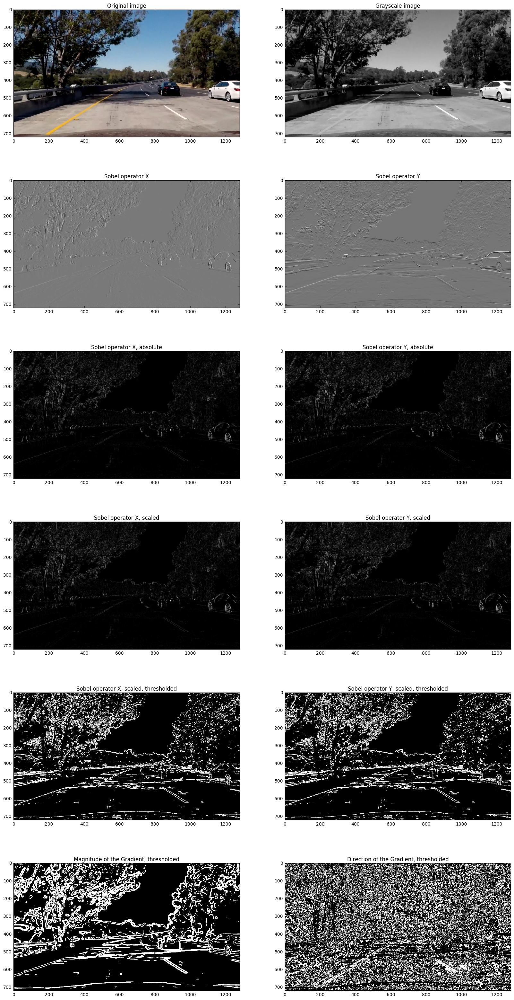

In [307]:
#fname = '/Users/olegair/Documents/MyNewCareer/SDCND/p4/CarND-Advanced-Lane-Lines/test_images/straight_lines1.jpg'
fname = '/Users/olegair/Documents/MyNewCareer/SDCND/p4/CarND-Advanced-Lane-Lines/test_images/test5.jpg'
img = cv2.cvtColor(cv2.imread(fname),cv2.COLOR_BGR2RGB)
img = undist(img)
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
abs_sobelx = np.absolute(sobelx)
abs_sobely = np.absolute(sobelx)
scaled_sobelx = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
scaled_sobely = np.uint8(255*abs_sobely/np.max(abs_sobely))
sxbinarx = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100)
sybinary = abs_sobel_thresh(img, orient='y', thresh_min=20, thresh_max=100)
mag_binary = mag_thresh(img, sobel_kernel=31, mag_thresh=(30, 100))
dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.3))

f, axarr = plt.subplots(6,2, figsize=(20,40))
axarr[0,0].imshow(img)
axarr[0,0].set_title('Original image')
axarr[0,1].imshow(gray,cmap='gray')
axarr[0,1].set_title('Grayscale image')
axarr[1,0].imshow(sobelx,cmap='gray')
axarr[1,0].set_title('Sobel operator X')
axarr[1,1].imshow(sobely,cmap='gray')
axarr[1,1].set_title('Sobel operator Y')
axarr[2,0].imshow(abs_sobelx,cmap='gray')
axarr[2,0].set_title('Sobel operator X, absolute')
axarr[2,1].imshow(abs_sobely,cmap='gray')
axarr[2,1].set_title('Sobel operator Y, absolute')
axarr[3,0].imshow(scaled_sobelx,cmap='gray')
axarr[3,0].set_title('Sobel operator X, scaled')
axarr[3,1].imshow(scaled_sobely,cmap='gray')
axarr[3,1].set_title('Sobel operator Y, scaled')
axarr[4,0].imshow(sxbinary,cmap='gray')
axarr[4,0].set_title('Sobel operator X, scaled, thresholded')
axarr[4,1].imshow(sybinary,cmap='gray')
axarr[4,1].set_title('Sobel operator Y, scaled, thresholded')
axarr[5,0].imshow(mag_binary,cmap='gray')
axarr[5,0].set_title('Magnitude of the Gradient, thresholded')
axarr[5,1].imshow(dir_binary,cmap='gray')
axarr[5,1].set_title('Direction of the Gradient, thresholded')

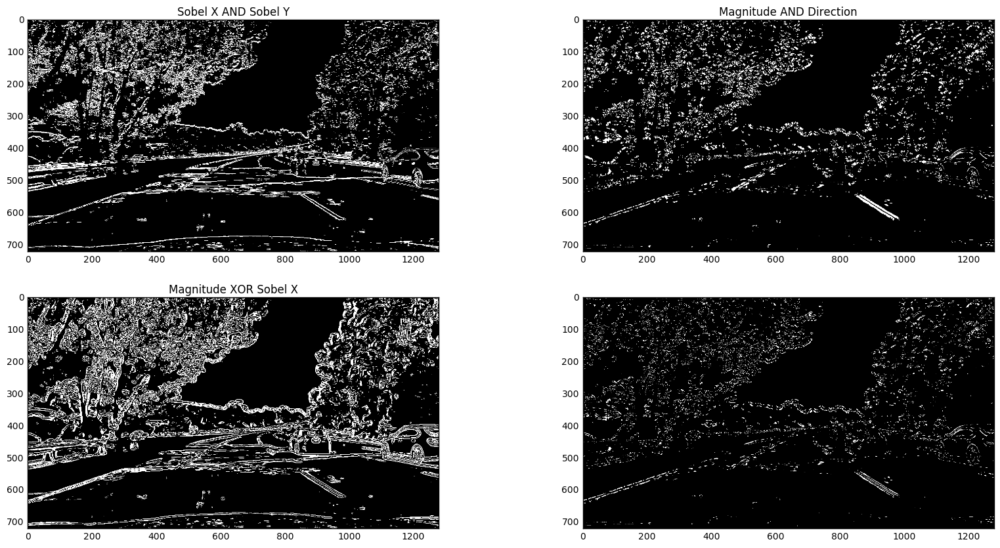

In [308]:
sx_sy = binary_and(sybinary, sxbinary)
mag_dir = binary_and(mag_binary, dir_binary)
mag_sx = binary_xor(mag_binary,sxbinary)
mag_sx_mag_dir = binary_and(mag_sx,mag_dir)

f, axarr = plt.subplots(2,2,figsize=(20,10))
axarr[0,0].imshow(sx_sy, cmap='gray')
axarr[0,0].set_title('Sobel X AND Sobel Y')
axarr[0,1].imshow(mag_dir, cmap='gray')
axarr[0,1].set_title('Magnitude AND Direction')
axarr[1,0].imshow(mag_sx, cmap='gray')
axarr[1,0].set_title('Magnitude XOR Sobel X')
axarr[1,1].imshow(mag_sx_mag_dir, cmap='gray')

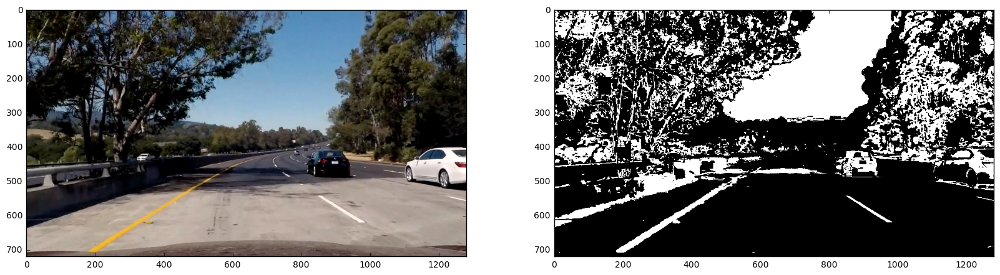

In [313]:
hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
s_th = ch_threshold(hls, 2, thresh=(80,255))

f, ax = plt.subplots(1,2,figsize=(20,10))
ax[0].imshow(img)
ax[1].imshow(s_th, cmap='gray')    

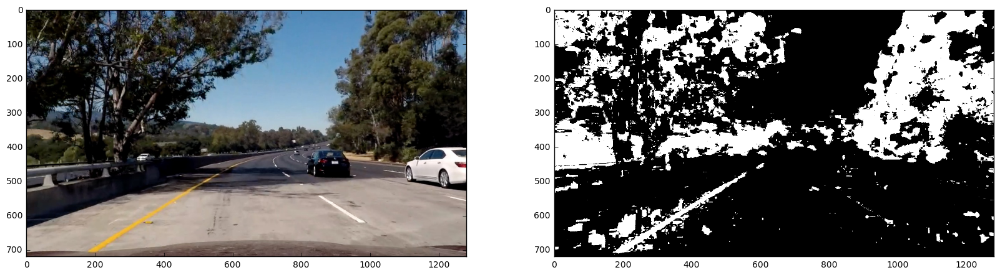

In [314]:
# binary hue
h_th = ch_threshold(hls, 0, thresh=(15,100))

f, ax = plt.subplots(1,2,figsize=(20,10))
ax[0].imshow(img)
ax[1].imshow(h_th, cmap='gray')    

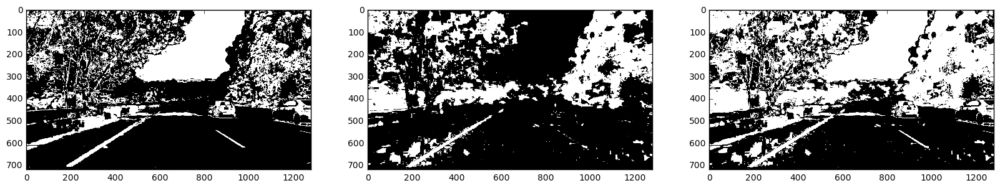

In [315]:
s_or_h = binary_or(h_th,s_th)
f,ax = plt.subplots(1,3,figsize=(20,10))
ax[0].imshow(s_th,cmap='gray')
ax[1].imshow(h_th,cmap='gray')
ax[2].imshow(s_or_h,cmap='gray')

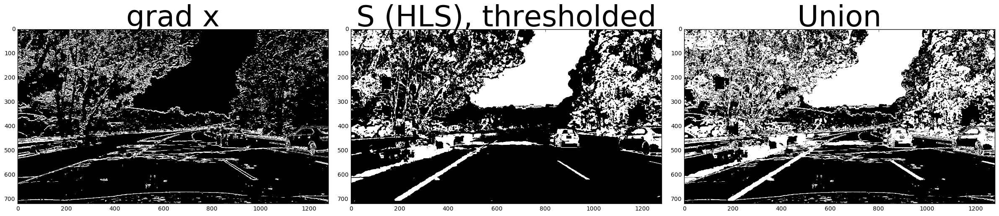

In [317]:
s_sx = binary_or(sxbinary, s_th)


f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()
ax1.imshow(sxbinary, cmap='gray')
ax1.set_title('grad x', fontsize=50)
ax2.imshow(s_th, cmap='gray')
ax2.set_title('S (HLS), thresholded', fontsize=50)
ax3.imshow(s_sx, cmap='gray')
ax3.set_title('Union', fontsize=50)


#plt.imshow(binary_gradx_s,cmap='gray')

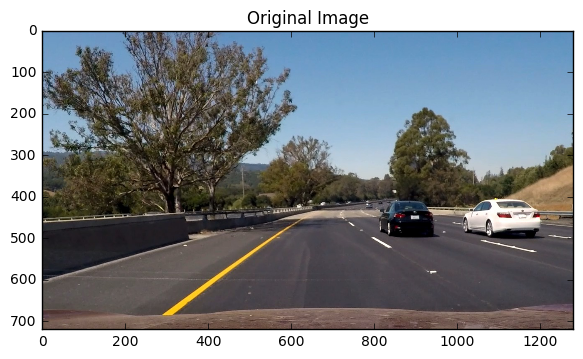

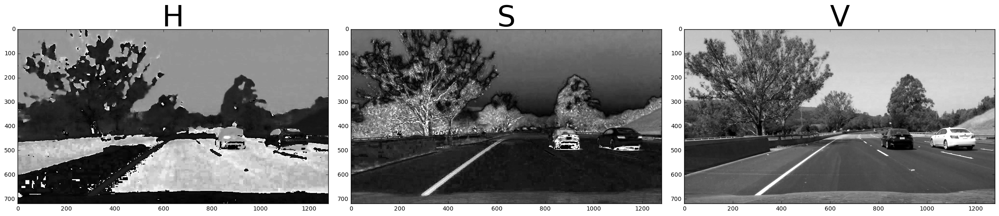

In [28]:
hsv = cv2.cvtColor(img,cv2.COLOR_RGB2HSV)
H_hsv = hsv[:,:,0]
S_hsv = hsv[:,:,1]
V_hsv = hsv[:,:,2]

f, (ax1) = plt.subplots(1,1)
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image')
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()
ax1.imshow(H_hsv, cmap='gray')
ax1.set_title('H', fontsize=50)
ax2.imshow(S_hsv, cmap='gray')
ax2.set_title('S', fontsize=50)
ax3.imshow(V_hsv, cmap='gray')
ax3.set_title('V', fontsize=50)

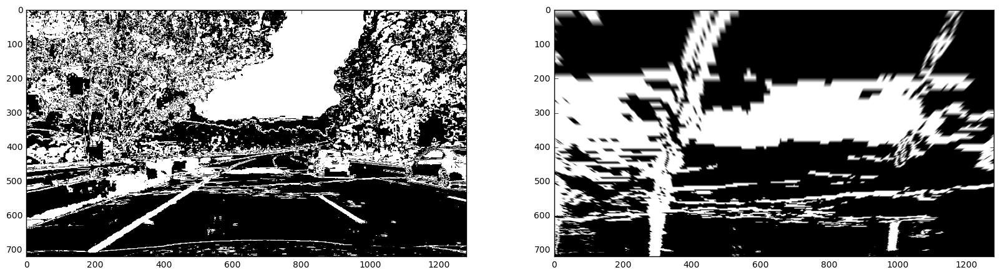

In [318]:
lines_persp = warp(s_sx)
show_2gr(s_sx,lines_persp)

//anaconda/envs/myPython3Environment/lib/python3.5/site-packages/ipykernel/__main__.py:150: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


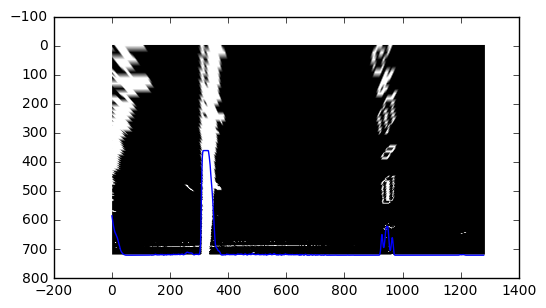

In [104]:
histogram = hist(lines_persp)
plt.imshow(lines_persp,cmap='gray')
plt.plot(img.shape[0]-histogram)

In [421]:
def first_lines(lines_persp):
    histogram = hist(lines_persp)
    mid_point = int(len(histogram)/2)
    left = int(np.argmax(histogram[:mid_point]))
    right = int(np.argmax(histogram[mid_point:])) + mid_point
 
    h = lines_persp.shape[0]
    w = lines_persp.shape[1]
    margin = 80
    num_wind = 20
    height = int(lines_persp.shape[0] / num_wind)

    left_line = [[],[]]
    right_line = [[],[]]

    for window in range(num_wind):

        y_low = h-(window+1)*height
        y_high = h-window*height

        left_x_low = left-margin
        left_x_high = left+margin

        right_x_low = right-margin
        right_x_high = right+margin

        left_box = np.nonzero(lines_persp[y_low:y_high, left_x_low:left_x_high])
        left_box_y = np.array(left_box[0])+y_low
        left_box_x = np.array(left_box[1])+left_x_low

        left_line[0].append(left_box_x)
        left_line[1].append(left_box_y)

        right_box = np.nonzero(lines_persp[y_low:y_high, right_x_low:right_x_high])
        right_box_y = np.array(right_box[0])+y_low
        right_box_x = np.array(right_box[1])+right_x_low

        right_line[0].append(right_box_x)
        right_line[1].append(right_box_y)

        if len(left_box[1])>50:
            left = left_x_low+int(np.mean(left_box[1]))
        if len(right_box[1])>50:
            right = right_x_low+int(np.mean(right_box[1]))
    left_line[0] = np.concatenate(left_line[0])
    left_line[1] = np.concatenate(left_line[1])
    right_line[0] = np.concatenate(right_line[0])
    right_line[1] = np.concatenate(right_line[1])
    
    #plt.plot(left_line[0],left_line[1],'.',color='brown')
    #plt.plot(right_line[0],right_line[1],'.',color='brown')

    # polyfit
    left_fit=np.polyfit(left_line[1],left_line[0],2)

    right_fit=np.polyfit(right_line[1],right_line[0],2)
    return left_fit, right_fit

In [424]:
def get_line(lines_persp, fit):
    binary_l = np.zeros_like(lines_persp)
#    left_fit, right_fit = first_lines(lines_persp)
    ploty = np.linspace(0, lines_persp.shape[0]-1, lines_persp.shape[0])
    plotx = fit[0]*ploty**2 + fit[1]*ploty + fit[2]

    line_points = np.column_stack((plotx,ploty))
    line = cv2.polylines(binary_l, np.int32([line_points]),color=1,isClosed=0,thickness=20)
#    plt.imshow(cv2.polylines(binary_l, np.int32([left_line]),color=1,isClosed=0,thickness=20),cmap='gray')
    return line

//anaconda/envs/myPython3Environment/lib/python3.5/site-packages/ipykernel/__main__.py:173: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


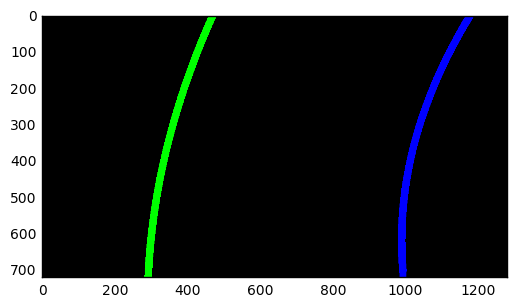

In [456]:
#plt.imshow(get_line(lines_persp, first_lines(lines_persp)[0]),cmap='gray')
left_line = get_line(lines_persp, first_lines(lines_persp)[0])
right_line = get_line(lines_persp, first_lines(lines_persp)[1])
left_right_lines = np.dstack((np.zeros_like(left_line), left_line, right_line))
plt.imshow(left_right_lines,cmap='gray')

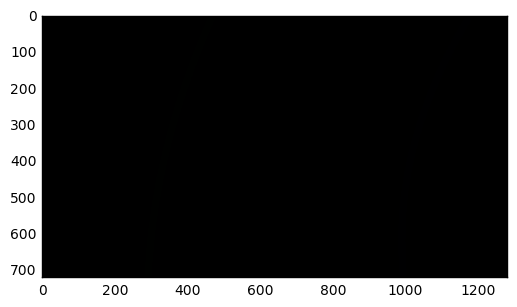

In [458]:
#plt.imshow(img)
#plt.imshow(unwarp(left_right_lines))
#left_right_lines=left_right_lines*255
left_right_lines=left_right_lines.astype('uint8')
def weighted_img(img, initial_img, α=0.8, β=1., λ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + λ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, λ)

#plt.imshow(weighted_img(img,left_right_lines))
plt.imshow(left_right_lines)

In [384]:
def draw_lines(lines_persp, left_fit, right_fit):
    ploty = np.linspace(0, lines_persp.shape[0]-1, lines_persp.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    plt.imshow(lines_persp,cmap='gray')
    plt.plot(left_fitx, ploty, color='red',linewidth=10)
    plt.plot(right_fitx, ploty, color='blue',linewidth=10)
    plt.xlim(0, lines_persp.shape[1])
    plt.ylim(lines_persp.shape[0], 0)
    histogram = hist(lines_persp)
    mid_point = int(len(histogram)/2)
    left = int(np.argmax(histogram[:mid_point]))
    right = int(np.argmax(histogram[mid_point:])) + mid_point
    plt.plot(lines_persp.shape[0]-histogram, linewidth=1, color = 'green')
    plt.plot(left, lines_persp.shape[0]-10, '*', color = 'yellow')
    plt.plot(right, lines_persp.shape[0]-10, '*', color = 'yellow')

//anaconda/envs/myPython3Environment/lib/python3.5/site-packages/ipykernel/__main__.py:150: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


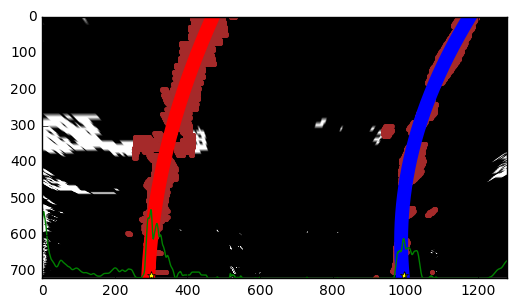

In [385]:
left_fit, right_fit = first_lines(lines_persp)
draw_lines(lines_persp,left_fit, right_fit)

//anaconda/envs/myPython3Environment/lib/python3.5/site-packages/ipykernel/__main__.py:150: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


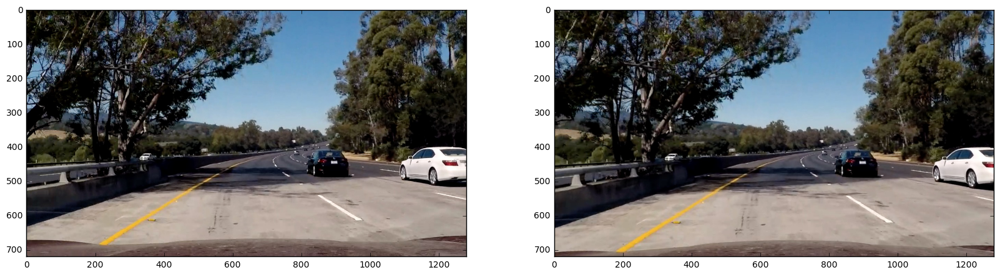

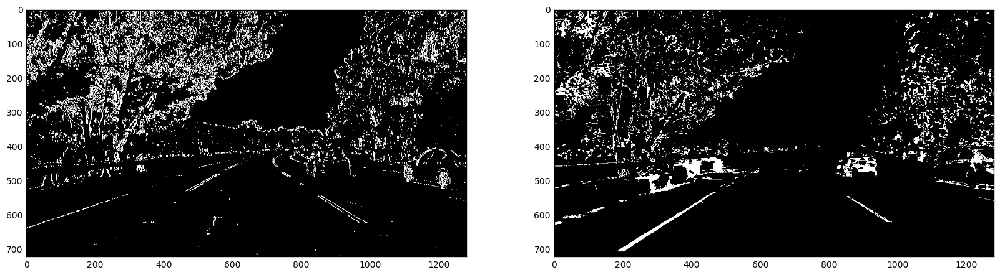

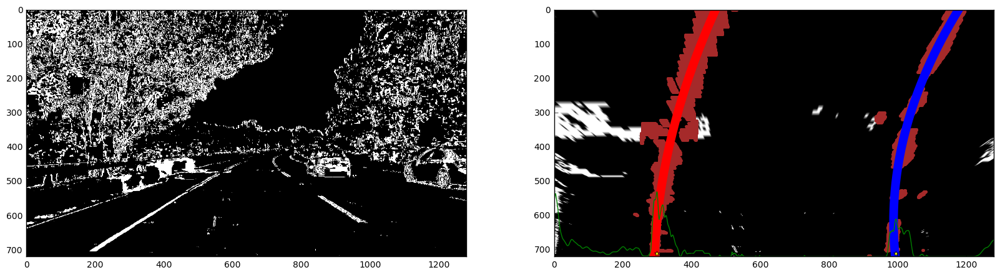

In [356]:
#0: load image
fname = '/Users/olegair/Documents/MyNewCareer/SDCND/p4/CarND-Advanced-Lane-Lines/test_images/test5.jpg'
#fname = '/Users/olegair/Documents/MyNewCareer/SDCND/p4/CarND-Advanced-Lane-Lines/test_images/straight_lines1.jpg'
img_bgr = cv2.imread(fname)
img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

#1: Distortion Correction
dst = undist(img)

show_2gr(img,dst)

#2: Get binary image
sxbinary = abs_sobel_thresh(dst, orient='x', thresh_min=20, thresh_max=100)
hls = cv2.cvtColor(dst, cv2.COLOR_RGB2HLS)
s_th = ch_threshold(hls, 2, thresh=(170,255))
s_sx = binary_or(sxbinary, s_th)

show_2gr(sxbinary, s_th)

#3: Warp binary image
lines_persp = warp(s_sx)

show_2gr(s_sx, lines_persp)

#4: Find lines polynoms
left_fit, right_fit = first_lines(lines_persp)

#5: Draw lines on warp image
draw_lines(lines_persp,left_fit, right_fit)